In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from pptx import Presentation
from pydataset import data
import plotlyPowerpoint as pp
dataset = pd.read_csv( 'C:/Users/Venkateshwaran/OneDrive/Desktop/pumf_cchs.csv' )

In [2]:
dataset.dtypes

ADM_RNO1      int64
VERDATE       int64
REFPER       object
GEOGPRV       int64
GEODGHR4      int64
             ...   
INCDGRRS      int64
ADM_040       int64
ADM_045       int64
ADM_050       int64
WTS_M       float64
Length: 691, dtype: object

In [3]:
dataset.columns

Index(['ADM_RNO1', 'VERDATE', 'REFPER', 'GEOGPRV', 'GEODGHR4', 'DHH_SEX',
       'DHHGMS', 'DHHDGHSZ', 'ADM_PRX', 'DHHGAGE',
       ...
       'FSCDVHF2', 'INCG015', 'INCDGHH', 'INCDGRCA', 'INCDGRPR', 'INCDGRRS',
       'ADM_040', 'ADM_045', 'ADM_050', 'WTS_M'],
      dtype='object', length=691)

In [4]:
dataset.head(5)

,ADM_RNO1,VERDATE,REFPER,GEOGPRV,GEODGHR4,DHH_SEX,DHHGMS,DHHDGHSZ,ADM_PRX,DHHGAGE,...,FSCDVHF2,INCG015,INCDGHH,INCDGRCA,INCDGRPR,INCDGRRS,ADM_040,ADM_045,ADM_050,WTS_M
0,1000,20240531,2019-2020,47,47906,2,1,2,2,3,...,0,1,5,4,4,4,1,1,6,762.82
1,100005,20240531,2019-2020,47,47906,1,1,2,2,5,...,0,2,4,2,2,2,6,1,6,31.78
2,100012,20240531,2019-2020,59,59914,2,2,1,2,5,...,6,2,2,1,1,1,2,1,6,59.24
3,100015,20240531,2019-2020,13,13904,1,2,1,2,5,...,0,2,3,3,3,9,6,1,6,22.83
4,100018,20240531,2019-2020,46,46903,1,2,1,2,4,...,0,2,1,1,1,9,2,1,6,39.96


In [5]:
import warnings
warnings.filterwarnings('ignore') 
convdata=dataset[["ADM_RNO1","CAN_015","DHH_SEX","DHHGAGE","EHG2DVH3",
                  "GEN_005","GENDVHDI","GEOGPRV","HWTDGISW",
                  "PAADVACV","PEX_005","SMK_005","SMK_060"]]
convdata["GENDVHDI"]=convdata["GENDVHDI"]+1
convdata
convdata.dtypes


ADM_RNO1    int64
CAN_015     int64
DHH_SEX     int64
DHHGAGE     int64
EHG2DVH3    int64
GEN_005     int64
GENDVHDI    int64
GEOGPRV     int64
HWTDGISW    int64
PAADVACV    int64
PEX_005     int64
SMK_005     int64
SMK_060     int64
dtype: object

In [6]:
agegroup={1:"12-17 years",2:"18-34 years",3:"35-49 years",4:"50-64 years",5:"65<"}
sextype={1:"Male",2:"Female"}
perceivedhealthd={1:"Poor",2:"Fair",3:"Good",4:"Very good",5:"Excellent",10:"Don’t know"}
geo={10:"NEWFOUNDLAND AND LABRADOR",11:"PRINCE EDWARD ISLAND",12:"NOVA SCOTIA",
     13:"NEW BRUNSWICK",24:"QUEBEC",35:"ONTARIO",46:"MANITOBA",47:"SASKATCHEWAN",
     48:"ALBERTA",59:"BRITISH COLUMBIA",60:"YUKON/NORTHWEST/NUNAVUT"}
bmi={1:"Normal weight",2:"Overweight/Obese",6:"Valid skip",9:"Not stated"}
SmokingFrequency={1:"Daily",2:"Occasionally",3:"Not at all",7:"Don’t know",8:"Refusal",9:"Not stated"}
physicallyactive={1:"Physically active above recommended level",2:"Physically active below recommended level",3:"No physical activity",6:"Valid skip",9:"Not stated"}
stoppedsmk={1:"<1 yr ago",2:">1 year to <2 yrs ago",3:">2 year to <3 yrs ago",4:">3 yrs ago",6:"Valid skip",7:"Don’t know",8:"Refusal",9:"Not stated"}

In [7]:
import warnings
warnings.filterwarnings('ignore')
convdata["sextype"] = convdata[["DHH_SEX"]].copy().replace({"DHH_SEX": sextype})
convdata["agegroup"] = convdata[["DHHGAGE"]].copy().replace({"DHHGAGE": agegroup})
convdata["perceivedhealthd"] = convdata[["GENDVHDI"]].copy().replace({"GENDVHDI": perceivedhealthd})
convdata["geo"] = convdata[["GEOGPRV"]].copy().replace({"GEOGPRV": geo})
convdata["bmi"] = convdata[["HWTDGISW"]].copy().replace({"HWTDGISW": bmi})
convdata["SmokingFrequency"] = convdata[["SMK_005"]].copy().replace({"SMK_005": SmokingFrequency})
convdata["physicallyactive"] = convdata[["PAADVACV"]].copy().replace({"PAADVACV": physicallyactive})
convdata["stoppedsmk"] = convdata[["SMK_060"]].copy().replace({"SMK_060": stoppedsmk})

In [8]:
convdata.columns
convdata

,ADM_RNO1,CAN_015,DHH_SEX,DHHGAGE,EHG2DVH3,GEN_005,GENDVHDI,GEOGPRV,HWTDGISW,PAADVACV,...,SMK_005,SMK_060,sextype,agegroup,perceivedhealthd,geo,bmi,SmokingFrequency,physicallyactive,stoppedsmk
0,1000,2,2,3,3,3,3,47,1,2,...,3,6,Female,35-49 years,Good,SASKATCHEWAN,Normal weight,Not at all,Physically active below recommended level,Valid skip
1,100005,2,1,5,2,3,3,47,2,3,...,3,6,Male,65<,Good,SASKATCHEWAN,Overweight/Obese,Not at all,No physical activity,Valid skip
2,100012,2,2,5,1,2,4,59,2,6,...,3,6,Female,65<,Very good,BRITISH COLUMBIA,Overweight/Obese,Not at all,Valid skip,Valid skip
3,100015,2,1,5,1,3,3,13,2,6,...,3,6,Male,65<,Good,NEW BRUNSWICK,Overweight/Obese,Not at all,Valid skip,Valid skip
4,100018,2,1,4,3,5,1,46,2,6,...,3,6,Male,50-64 years,Poor,MANITOBA,Overweight/Obese,Not at all,Valid skip,Valid skip
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108247,999964,2,2,5,1,2,4,11,2,3,...,1,6,Female,65<,Very good,PRINCE EDWARD ISLAND,Overweight/Obese,Daily,No physical activity,Valid skip
108248,999967,1,2,2,3,3,3,35,1,6,...,3,6,Female,18-34 years,Good,ONTARIO,Normal weight,Not at all,Valid skip,Valid skip
108249,999976,1,1,2,3,1,5,13,1,6,...,3,6,Male,18-34 years,Excellent,NEW BRUNSWICK,Normal weight,Not at all,Valid skip,Valid skip
108250,999980,2,1,5,2,3,3,59,2,6,...,3,6,Male,65<,Good,BRITISH COLUMBIA,Overweight/Obese,Not at all,Valid skip,Valid skip


In [9]:
heatmap=convdata.copy()
convdata=convdata[['ADM_RNO1','agegroup','sextype','geo','perceivedhealthd','bmi','SmokingFrequency','GENDVHDI','SMK_005','physicallyactive','stoppedsmk','PAADVACV']]

In [10]:
values1=['Daily','Occasionally','Not at all']
convdata= convdata[convdata['SmokingFrequency'].isin(values1)]
display(convdata['SmokingFrequency'].unique())
values2=['Normal weight','Overweight/Obese']
convdata= convdata[convdata['bmi'].isin(values2)]
values3=['Don’t know']
convdata= convdata[~convdata['perceivedhealthd'].isin(values3)]
convdata
convdata.to_csv('C:/Users/Venkateshwaran/OneDrive/Desktop/Data601_Assignment/mine.csv', index=False)

array(['Not at all', 'Daily', 'Occasionally'], dtype=object)

In [11]:
analysis1=convdata.groupby(['bmi','SmokingFrequency'],as_index=False)['GENDVHDI'].mean().reset_index()
analysis1['percentage'] = analysis1['GENDVHDI'] / analysis1.groupby('bmi')['GENDVHDI'].transform('sum') * 100
analysis1['percentage'] = round(analysis1['percentage'],2)
analysis1

,index,bmi,SmokingFrequency,GENDVHDI,percentage
0,0,Normal weight,Daily,3.277804,30.25
1,1,Normal weight,Not at all,3.814459,35.20
2,2,Normal weight,Occasionally,3.743702,34.55
3,3,Overweight/Obese,Daily,3.151904,30.89
4,4,Overweight/Obese,Not at all,3.492109,34.22
5,5,Overweight/Obese,Occasionally,3.560591,34.89


In [12]:
convdata

,ADM_RNO1,agegroup,sextype,geo,perceivedhealthd,bmi,SmokingFrequency,GENDVHDI,SMK_005,physicallyactive,stoppedsmk,PAADVACV
0,1000,35-49 years,Female,SASKATCHEWAN,Good,Normal weight,Not at all,3,3,Physically active below recommended level,Valid skip,2
1,100005,65<,Male,SASKATCHEWAN,Good,Overweight/Obese,Not at all,3,3,No physical activity,Valid skip,3
2,100012,65<,Female,BRITISH COLUMBIA,Very good,Overweight/Obese,Not at all,4,3,Valid skip,Valid skip,6
3,100015,65<,Male,NEW BRUNSWICK,Good,Overweight/Obese,Not at all,3,3,Valid skip,Valid skip,6
4,100018,50-64 years,Male,MANITOBA,Poor,Overweight/Obese,Not at all,1,3,Valid skip,Valid skip,6
...,...,...,...,...,...,...,...,...,...,...,...,...
108247,999964,65<,Female,PRINCE EDWARD ISLAND,Very good,Overweight/Obese,Daily,4,1,No physical activity,Valid skip,3
108248,999967,18-34 years,Female,ONTARIO,Good,Normal weight,Not at all,3,3,Valid skip,Valid skip,6
108249,999976,18-34 years,Male,NEW BRUNSWICK,Excellent,Normal weight,Not at all,5,3,Valid skip,Valid skip,6
108250,999980,65<,Male,BRITISH COLUMBIA,Good,Overweight/Obese,Not at all,3,3,Valid skip,Valid skip,6


In [13]:
anlysis1a= analysis1[analysis1['bmi']=='Normal weight']
anlysis1a

,index,bmi,SmokingFrequency,GENDVHDI,percentage
0,0,Normal weight,Daily,3.277804,30.25
1,1,Normal weight,Not at all,3.814459,35.20
2,2,Normal weight,Occasionally,3.743702,34.55


In [14]:
import seaborn as sns

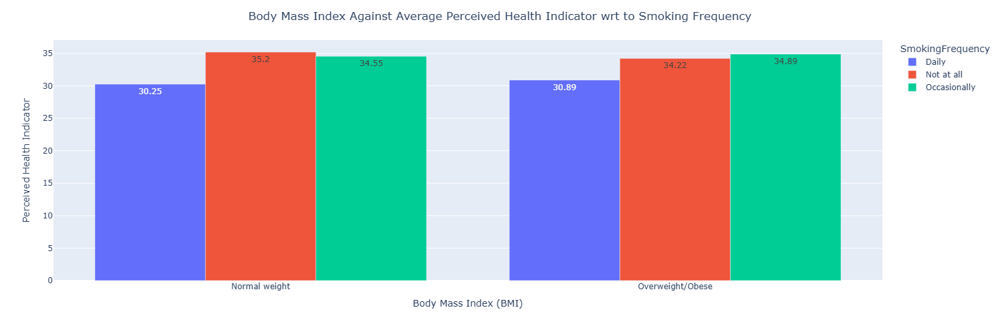

In [15]:
fig = px.bar(analysis1, x="bmi", y="percentage",color='SmokingFrequency',barmode='group',height=500,width=800,text_auto=True)
#fig.update_yaxes(range=[0, 100])
fig.update_layout(
    title="Body Mass Index Against Average Perceived Health Indicator wrt to Smoking Frequency",title_x=0.5,
    xaxis_title="Body Mass Index (BMI)",
    yaxis_title="Perceived Health Indicator",
)
fig.show()

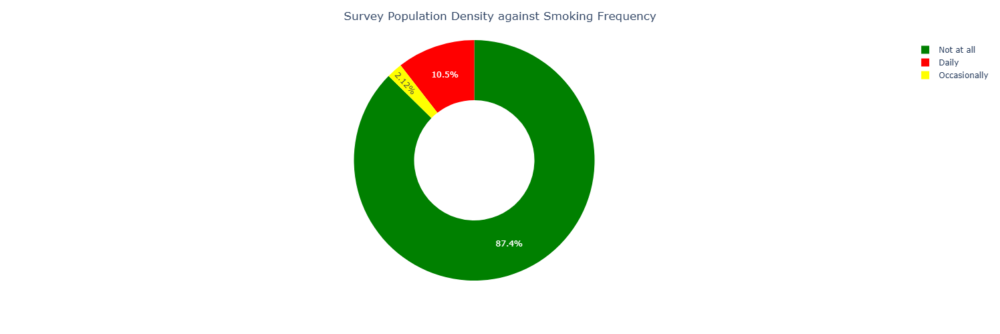

,SmokingFrequency,count
0,Daily,9532
1,Not at all,79361
2,Occasionally,1928


In [16]:
analysis1a = convdata.groupby('SmokingFrequency').size().reset_index().rename(columns={"index": "value", 0: "count"})
analysis1a= analysis1a[analysis1a['SmokingFrequency'].isin(values1)]
fig = px.pie(analysis1a, values='count', names='SmokingFrequency',hole=.5,width=500,height=500,color_discrete_sequence=["green", "red","yellow"])
fig.update_layout(title="Survey Population Density against Smoking Frequency",title_x=0.5)
fig.show()
analysis1a

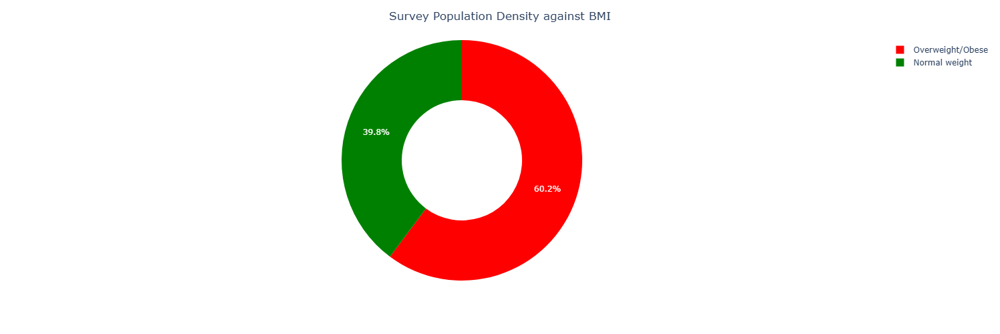

,bmi,count
0,Normal weight,36151
1,Overweight/Obese,54670


In [17]:
analysis1b = convdata.groupby('bmi').size().reset_index().rename(columns={"index": "value", 0: "count"})
analysis1b= analysis1b[analysis1b['bmi'].isin(values2)]
analysis1b
fig = px.pie(analysis1b, values='count', names='bmi',hole=.5,width=500,height=500,color_discrete_sequence=["red","green"])
fig.update_layout(title="Survey Population Density against BMI",title_x=0.5)
fig.show()
analysis1b

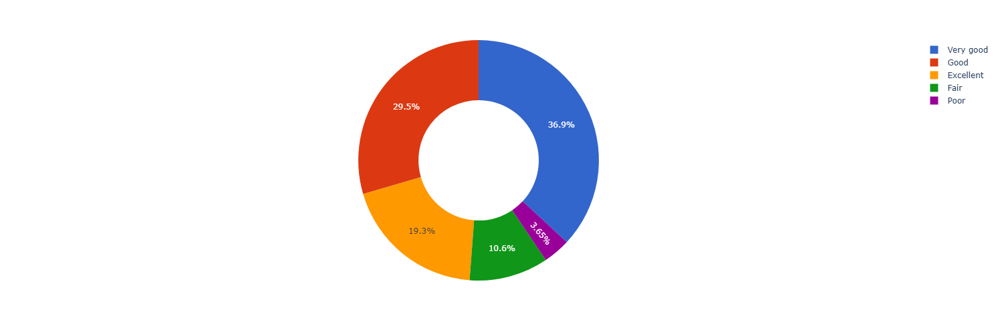

In [18]:
analysis1c = convdata.groupby('perceivedhealthd').size().reset_index().rename(columns={"index": "value", 0: "count"})
#analysis1c= analysis1b[analysis1b['bmi'].isin(values2)]
analysis1c
fig = px.pie(analysis1c, values='count', names='perceivedhealthd',hole=.5,width=500,height=500,color_discrete_sequence=px.colors.qualitative.G10)
fig.show()


In [19]:
#analysis1.to_csv('C:/Users/Venkateshwaran/OneDrive/Desktop/Data601_Assignment/question1_data.csv', index=False)

In [20]:
analysis2=convdata.groupby(['SmokingFrequency','agegroup'])['GENDVHDI'].mean().reset_index()
analysis2

,SmokingFrequency,agegroup,GENDVHDI
0,Daily,18-34 years,3.460057
1,Daily,35-49 years,3.367039
2,Daily,50-64 years,3.094328
3,Daily,65<,3.096902
4,Not at all,18-34 years,3.931262
5,Not at all,35-49 years,3.840022
6,Not at all,50-64 years,3.627040
7,Not at all,65<,3.455410
8,Occasionally,18-34 years,3.732558
9,Occasionally,35-49 years,3.760081


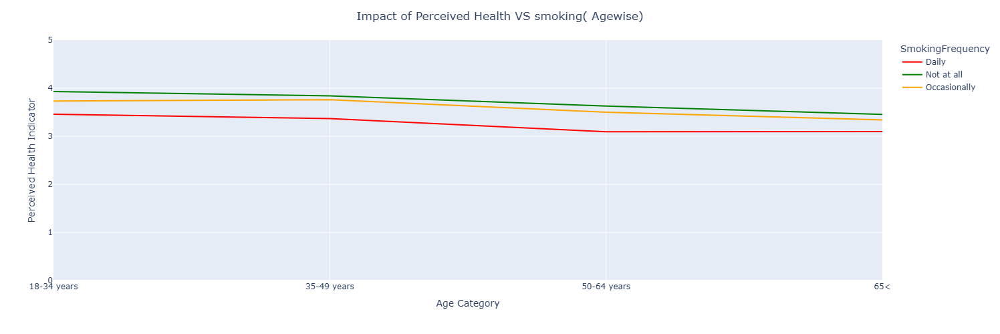

In [21]:
fig = px.line(analysis2, x="agegroup", y="GENDVHDI", color="SmokingFrequency",hover_data=['agegroup'],color_discrete_sequence=['red','green','orange'],
              height=500,width=1000)
fig.update_yaxes(range=[0, 5])
fig.update_layout(
    title="Impact of Perceived Health VS smoking( Agewise)",title_x=0.5,
    xaxis_title="Age Category",
    yaxis_title="Perceived Health Indicator",
)
fig.show()

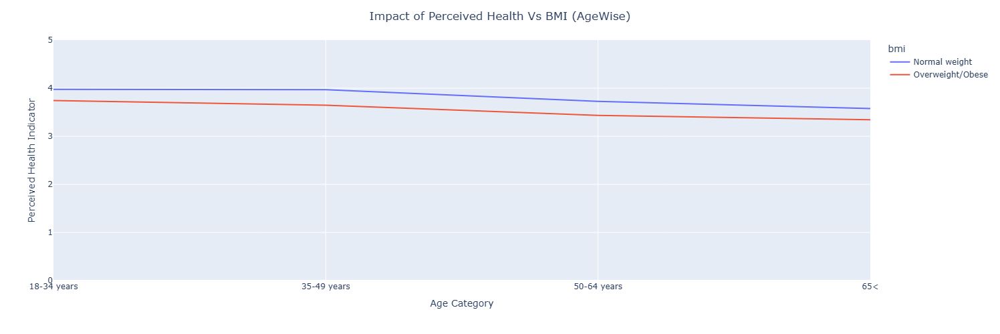

In [22]:
analysis3=convdata.groupby(['bmi','agegroup'])['GENDVHDI'].mean().reset_index()
analysis3
fig = px.line(analysis3, x="agegroup", y="GENDVHDI", color="bmi",hover_data=['agegroup'],height=500,width=1000)
fig.update_yaxes(range=[0, 5])
fig.update_layout(
    title="Impact of Perceived Health Vs BMI (AgeWise) ",title_x=0.5,
    xaxis_title="Age Category",
    yaxis_title="Perceived Health Indicator",
)
fig.show()

In [23]:
analysis4=convdata.groupby(['SmokingFrequency','bmi'])['GENDVHDI'].count().reset_index()
analysis4['percentage'] = analysis4['GENDVHDI'] / analysis4.groupby('SmokingFrequency')['GENDVHDI'].transform('sum') * 100
analysis4['percentage'] = round(analysis4['percentage'],2)
analysis4

,SmokingFrequency,bmi,GENDVHDI,percentage
0,Daily,Normal weight,4226,44.33
1,Daily,Overweight/Obese,5306,55.67
2,Not at all,Normal weight,31012,39.08
3,Not at all,Overweight/Obese,48349,60.92
4,Occasionally,Normal weight,913,47.35
5,Occasionally,Overweight/Obese,1015,52.65


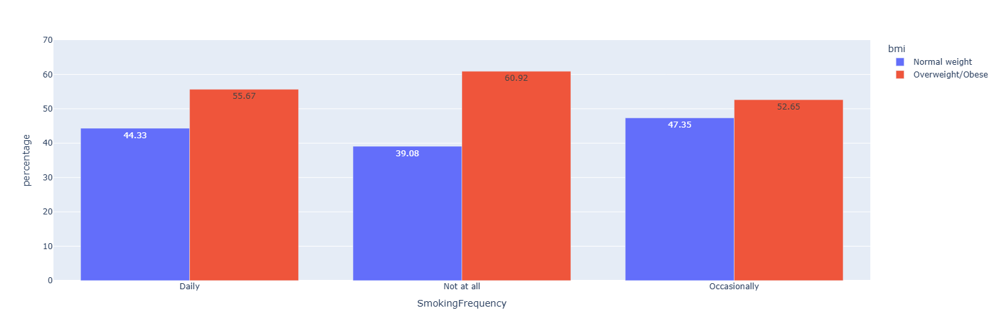

In [24]:
fig = px.bar(analysis4, x="SmokingFrequency", y="percentage", color="bmi",hover_data=['bmi'],barmode='group',height=500,width=800,text_auto=True)
fig.update_yaxes(range=[0, 70])
fig.show()

In [25]:
analysis5=convdata.groupby(['geo'])['GENDVHDI'].mean().reset_index()
analysis5

,geo,GENDVHDI
0,ALBERTA,3.587806
1,BRITISH COLUMBIA,3.610967
2,MANITOBA,3.512526
3,NEW BRUNSWICK,3.382936
4,NEWFOUNDLAND AND LABRADOR,3.499233
5,NOVA SCOTIA,3.424781
6,ONTARIO,3.611777
7,PRINCE EDWARD ISLAND,3.475132
8,QUEBEC,3.693046
9,SASKATCHEWAN,3.448595


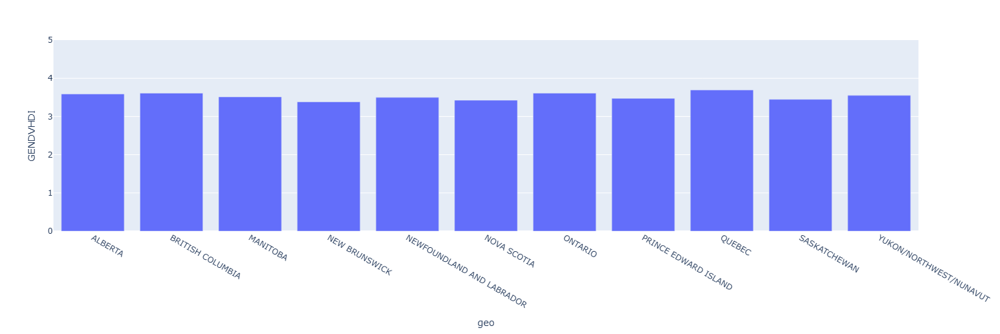

In [26]:
fig = px.bar(analysis5, x="geo", y="GENDVHDI",barmode='group',height=500,width=1500)
fig.update_yaxes(range=[0, 5])
fig.show()

In [27]:
import json
canada_states= json.load(open("canada_provinces.geojson",'r'))

In [28]:
state_id_map={}
for feature in canada_states['features']:
    feature['id']= feature['properties']['CODE']
    state_id_map[feature['properties']['NAME']] = feature['id']

state_id_map

{'Alberta': 'CA01',
 'Saskatchewan': 'CA11',
 'Manitoba': 'CA03',
 'Newfoundland  & Labrador': 'CA05',
 'Prince Edward Island': 'CA09',
 'Nova Scotia': 'CA07',
 'Northwest Territories': 'CA06',
 'Nunavut': 'CA13',
 'Ontario': 'CA08',
 'New Brunswick': 'CA04',
 'Yukon Territory': 'CA12',
 'British Columbia': 'CA02',
 'Quebec': 'CA10'}

In [29]:
analysis5
analysis5["geo"] = analysis5["geo"].replace(["NEWFOUNDLAND AND LABRADOR"], "Newfoundland  & Labrador")
analysis5["geo"] = analysis5["geo"].replace(["YUKON/NORTHWEST/NUNAVUT"], "YUKON TERRITORY")
analysis5['geo']=analysis5['geo'].str.title()
analysis5['geo']

0                      Alberta
1             British Columbia
2                     Manitoba
3                New Brunswick
4     Newfoundland  & Labrador
5                  Nova Scotia
6                      Ontario
7         Prince Edward Island
8                       Quebec
9                 Saskatchewan
10             Yukon Territory
Name: geo, dtype: object

In [30]:
analysis5['id']=analysis5['geo'].apply(lambda x: state_id_map[x])
#analysis5["id"] = analysis5[["geo"]].copy().replace({"geo": state_id_map})
analysis5['healthscale']=np.log10(analysis5['GENDVHDI'])
analysis5

,geo,GENDVHDI,id,healthscale
0,Alberta,3.587806,CA01,0.554829
1,British Columbia,3.610967,CA02,0.557623
2,Manitoba,3.512526,CA03,0.545619
3,New Brunswick,3.382936,CA04,0.529294
4,Newfoundland & Labrador,3.499233,CA05,0.543973
5,Nova Scotia,3.424781,CA07,0.534633
6,Ontario,3.611777,CA08,0.557721
7,Prince Edward Island,3.475132,CA09,0.540971
8,Quebec,3.693046,CA10,0.567385
9,Saskatchewan,3.448595,CA11,0.537642


In [ ]:
fig= px.choropleth(analysis5,locations='id',geojson=canada_states,color='GENDVHDI',scope='north america',hover_name='geo',hover_data=['GENDVHDI'],height=1000,width=1000)
fig.update_geos(fitbounds="locations",visible=False)
fig.show()

In [ ]:
fig= px.choropleth_mapbox(analysis5,locations='id',geojson=canada_states,color='GENDVHDI',hover_name='geo',hover_data=['GENDVHDI'],height=1000,width=1000,
                          mapbox_style="carto-positron",center={'lat':62.24,'lon':-96.78})
fig.update_layout(mapbox_zoom=2)
fig.show()

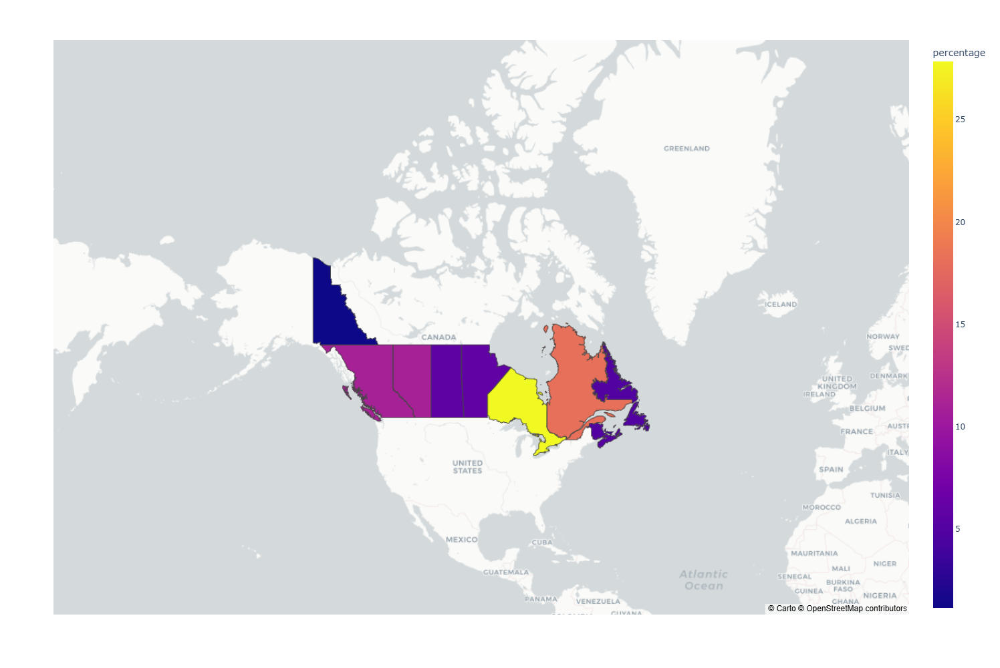

,geo,SmokingFrequency,id,percentage
0,Alberta,10005,CA01,11.016175
1,British Columbia,9994,CA02,11.004063
2,Manitoba,5389,CA03,5.933650
3,New Brunswick,4489,CA04,4.942689
4,Newfoundland & Labrador,4561,CA05,5.021966
5,Nova Scotia,4786,CA07,5.269706
6,Ontario,25287,CA08,27.842680
7,Prince Edward Island,3599,CA09,3.962740
8,Quebec,16465,CA10,18.129067
9,Saskatchewan,5194,CA11,5.718942


In [33]:
analysissmokingmap=convdata.groupby('geo')['SmokingFrequency'].count().reset_index()
analysissmokingmap["geo"] = analysissmokingmap["geo"].replace(["NEWFOUNDLAND AND LABRADOR"], "Newfoundland  & Labrador")
analysissmokingmap["geo"] = analysissmokingmap["geo"].replace(["YUKON/NORTHWEST/NUNAVUT"], "YUKON TERRITORY")
analysissmokingmap['geo']=analysissmokingmap['geo'].str.title()
analysissmokingmap['geo']
analysissmokingmap['id']=analysissmokingmap['geo'].apply(lambda x: state_id_map[x])
analysissmokingmap['percentage'] = analysissmokingmap['SmokingFrequency'] / analysissmokingmap['SmokingFrequency'].sum() * 100
analysissmokingmap
fig= px.choropleth_mapbox(analysissmokingmap,locations='id',geojson=canada_states,color='percentage',hover_name='geo',hover_data=['percentage'],height=1000,width=1000,
                          mapbox_style="carto-positron",center={'lat':62.24,'lon':-96.78})
fig.update_layout(mapbox_zoom=2)
fig.show()
analysissmokingmap

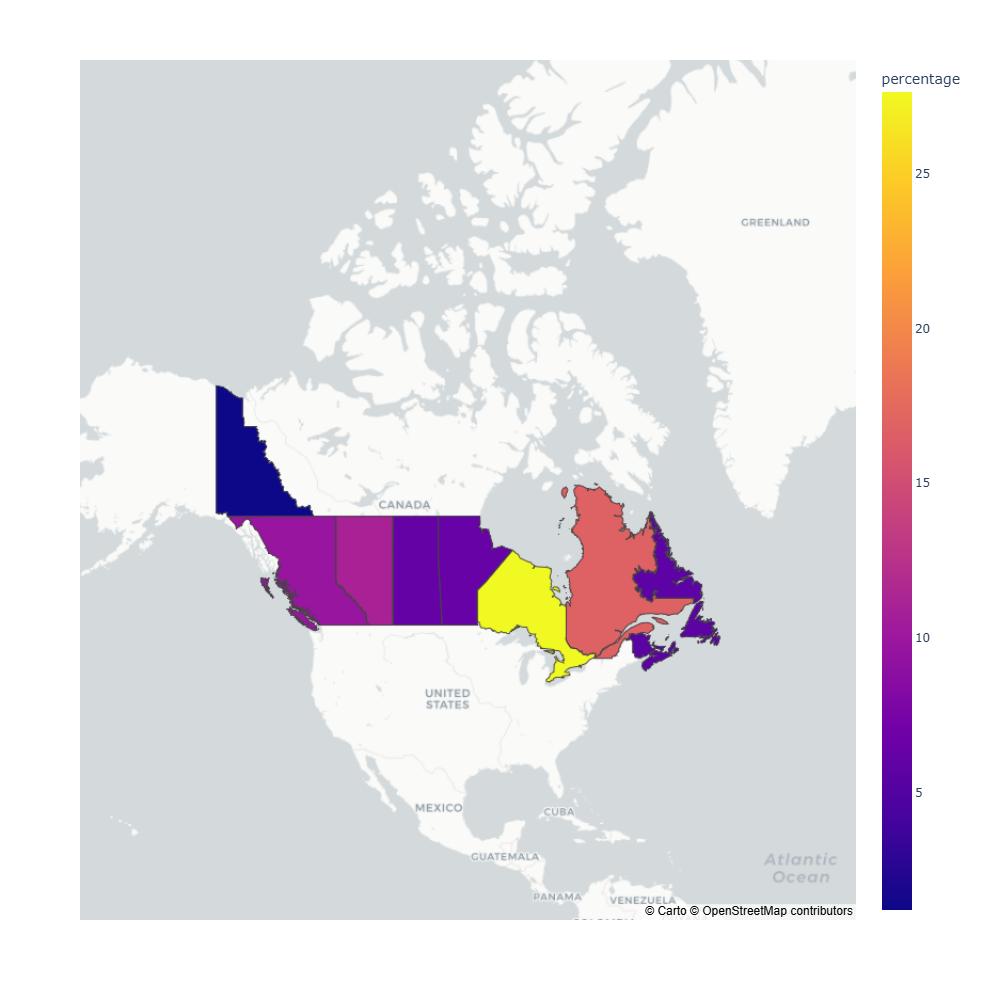

,geo,bmi,id,percentage
0,Alberta,6038,CA01,11.044449
1,British Columbia,5297,CA02,9.689043
2,Manitoba,3431,CA03,6.275837
3,New Brunswick,3047,CA04,5.573441
4,Newfoundland & Labrador,3112,CA05,5.692336
5,Nova Scotia,3077,CA07,5.628315
6,Ontario,15108,CA08,27.634900
7,Prince Edward Island,2371,CA09,4.336931
8,Quebec,9162,CA10,16.758734
9,Saskatchewan,3369,CA11,6.162429


In [55]:
analysisbmimap=convdata.copy()
analysisbmimap = analysisbmimap[analysisbmimap['bmi'] == 'Overweight/Obese']
analysisbmimap=analysisbmimap.groupby('geo')['bmi'].count().reset_index()
analysisbmimap["geo"] = analysisbmimap["geo"].replace(["NEWFOUNDLAND AND LABRADOR"], "Newfoundland  & Labrador")
analysisbmimap["geo"] = analysisbmimap["geo"].replace(["YUKON/NORTHWEST/NUNAVUT"], "YUKON TERRITORY")
analysisbmimap['geo']= analysisbmimap['geo'].str.title()
analysisbmimap['geo']
analysisbmimap['id']=analysisbmimap['geo'].apply(lambda x: state_id_map[x])
analysisbmimap['percentage'] = analysisbmimap['bmi'] / analysisbmimap['bmi'].sum() * 100
analysisbmimap
fig2= px.choropleth_mapbox(analysisbmimap,locations='id',geojson=canada_states,color='percentage',hover_name='geo',hover_data=['percentage'],height=1000,width=1000,
                          mapbox_style="carto-positron",center={'lat':62.24,'lon':-96.78})
fig2.update_layout(mapbox_zoom=2)
fig2.show()


analysisbmimap

In [49]:

analysisbmimap=convdata.copy()
display(len(analysisbmimap))
analysisbmimap = analysisbmimap[analysisbmimap['bmi'] == 'Overweight/Obese']
display(len(analysisbmimap))

11

90821

54670

In [ ]:
analysis5a = convdata[convdata['stoppedsmk'].isin(['<1 yr ago', '>1 year to <2 yrs ago', '>2 year to <3 yrs ago', '>3 yrs ago'])]
analysis5a= analysis5a.groupby(['stoppedsmk'])['GENDVHDI'].mean().reset_index()
analysis5a['Ind']='Yes'
analysis5b = convdata[~convdata['stoppedsmk'].isin(['<1 yr ago', '>1 year to <2 yrs ago', '>2 year to <3 yrs ago', '>3 yrs ago'])]
analysis5b= analysis5b.groupby(['stoppedsmk'])['GENDVHDI'].mean().reset_index()
analysis5b['Ind']='No'
analysis5c=pd.concat([analysis5a, analysis5b], axis=0)
analysis5c.groupby(['Ind'])['GENDVHDI'].mean().reset_index()

In [ ]:
fig = px.bar(analysis5c.groupby(['Ind'])['GENDVHDI'].mean().reset_index(), x="Ind", y="GENDVHDI",color='Ind',text_auto=True,height=500,width=500)
fig.update_yaxes(range=[0, 5])
fig.update_layout(
    title="Average Health Improvement upon stopping the smoking",
    xaxis_title="Stopped Smoking Indicator",
    yaxis_title="Perceived Health Indicator",title_x=0.5
)
fig.show()

In [ ]:
analysis6=convdata[['physicallyactive','bmi','GENDVHDI']]
analysis6['physicallyactive']= analysis6['physicallyactive'].apply(lambda x: 'No physical activity' if x in ('Not stated') else x)
analysis6= analysis6[analysis6['physicallyactive']!= 'Valid skip']
analysis6=analysis6.groupby(['physicallyactive','bmi'])['GENDVHDI'].mean().reset_index()
analysis6['percentage'] = analysis6['GENDVHDI'] / analysis6.groupby('bmi')['GENDVHDI'].transform('sum') * 100
analysis6.sort_values(by = 'percentage', ascending=True)

In [ ]:
fig = px.bar(analysis6, x="bmi", y="percentage",color='physicallyactive',barmode='group',height=500,width=1000,text_auto=True)
fig.update_yaxes(range=[0, 50])
fig.update_layout(
    title="Physically Active Against Average Perceived Health Indicator wrt to BMI",title_x=0.5,
    xaxis_title="Body Mass Index (BMI)",
    yaxis_title="Perceived Health Indicator",
)
fig.show()

In [ ]:
import plotly.express as px
values1=['Daily','Occasionally','Not at all']
heatmap= heatmap[heatmap['SmokingFrequency'].isin(values1)]
display(heatmap['SmokingFrequency'].unique())
values2=['Normal weight','Overweight/Obese']
heatmap= heatmap[heatmap['bmi'].isin(values2)]
values3=['Don’t know']
heatmap= heatmap[~heatmap['perceivedhealthd'].isin(values3)]
heatmap
fig = px.density_heatmap(heatmap, x="SmokingFrequency", y="bmi", z="GENDVHDI",facet_col="sextype", histfunc="avg",text_auto=True,
                          labels=dict(x="Smoking Frequency", y="bmi", z= "avge health Indicator"))
fig.show()

In [ ]:
heatmap2= heatmap[heatmap['PAADVACV'].isin([1,2,3])]
fig = px.density_heatmap(heatmap2, x="physicallyactive", y="bmi", z="GENDVHDI", facet_col="sextype", histfunc="avg",text_auto=True,height=500,width=1500,
                          labels=dict(x="physicallyactive", y="bmi", z= "avge health Indicator"))
fig.show()




In [ ]:
fig = px.density_heatmap(heatmap[~heatmap['stoppedsmk'].isin(["Not stated","Don’t know","Valid skip","Refusal"])], x="stoppedsmk", y="sextype", z="GENDVHDI", histfunc="avg",text_auto=True,
                          labels=dict(x="stoppedsmk", y="SmokingFrequency", z= "avge health Indicator"))
fig.show()

fig = px.density_heatmap(heatmap[heatmap['stoppedsmk'].isin(["Not stated","Don’t know","Valid skip","Refusal"])], x="stoppedsmk", y="sextype", z="GENDVHDI", histfunc="avg",text_auto=True,
                          labels=dict(x="stoppedsmk", y="SmokingFrequency", z= "avge health Indicator"))
fig.show()